# 🦠 MalImg Dataset — Exploratory Data Analysis

**Dataset:** [MalImg – Malware as Images](https://www.kaggle.com/datasets/manmandes/malimg)  
**Description:** The MalImg dataset contains grayscale visualizations of malware binaries, organized into 25 malware families. Each binary file is converted to a 2D grayscale image and the resulting image is used to classify the malware family.

---
### Notebook Outline
1. Environment Setup & Imports
2. Dataset Loading & Directory Structure
3. Class Distribution Analysis
4. Image Dimension Analysis
5. Pixel Intensity Analysis
6. Sample Image Visualization per Class
7. Image Texture & Structural Analysis (LBP, FFT)
8. Intra-class vs Inter-class Similarity
9. Dimensionality Reduction (PCA / t-SNE)
10. Key Findings & Recommendations

## 1. Environment Setup & Imports

In [20]:
# Install any missing libraries (uncomment as needed)
#!pip install opencv-python scikit-image scikit-learn seaborn tqdm

import os
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from pathlib import Path
from collections import defaultdict
from tqdm.notebook import tqdm

import cv2
from PIL import Image

from skimage.feature import local_binary_pattern
from skimage.measure import shannon_entropy
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
from scipy.stats import entropy as scipy_entropy

# Plotting style
plt.rcParams.update({
    'figure.dpi': 120,
    'font.size': 11,
    'axes.titlesize': 13,
    'axes.labelsize': 11,
})
sns.set_theme(style='whitegrid', palette='tab20')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

print('✅ Imports successful')

✅ Imports successful


## 2. Dataset Loading & Directory Structure

> **⚠️ Update `DATASET_ROOT` below** to point to the extracted MalImg dataset folder on your machine.
> Expected structure:
> ```
> malimg_paper_dataset_imgs/
>   Adialer.C/
>     *.png
>   Agent.FYI/
>     *.png
>   ...
> ```

In [21]:
# ── SET YOUR PATH HERE ──────────────────────────────────────────────────────
DATASET_ROOT = Path('./data/malimg_dataset/train')   # <-- update as needed
# ─────────────────────────────────────────────────────────────────────────────

assert DATASET_ROOT.exists(), f'Dataset not found at {DATASET_ROOT}'

# Discover classes and image paths
class_dirs = sorted([d for d in DATASET_ROOT.iterdir() if d.is_dir()])
classes = [d.name for d in class_dirs]

image_records = []
for cls_dir in class_dirs:
    for img_path in cls_dir.glob('*.png'):
        image_records.append({'class': cls_dir.name, 'path': str(img_path)})

df = pd.DataFrame(image_records)

print(f'Total classes  : {len(classes)}')
print(f'Total images   : {len(df)}')
print(f'\nClasses: {classes}')
df.head()

Total classes  : 25
Total images   : 7459

Classes: ['Adialer.C', 'Agent.FYI', 'Allaple.A', 'Allaple.L', 'Alueron.gen!J', 'Autorun.K', 'C2LOP.P', 'C2LOP.gen!g', 'Dialplatform.B', 'Dontovo.A', 'Fakerean', 'Instantaccess', 'Lolyda.AA1', 'Lolyda.AA2', 'Lolyda.AA3', 'Lolyda.AT', 'Malex.gen!J', 'Obfuscator.AD', 'Rbot!gen', 'Skintrim.N', 'Swizzor.gen!E', 'Swizzor.gen!I', 'VB.AT', 'Wintrim.BX', 'Yuner.A']


,class,path
0,Adialer.C,data/malimg_dataset/train/Adialer.C/0044f0746b...
1,Adialer.C,data/malimg_dataset/train/Adialer.C/0046a83d93...
2,Adialer.C,data/malimg_dataset/train/Adialer.C/03143ce483...
3,Adialer.C,data/malimg_dataset/train/Adialer.C/047bead96b...
4,Adialer.C,data/malimg_dataset/train/Adialer.C/04e15fe77e...


## 3. Class Distribution Analysis

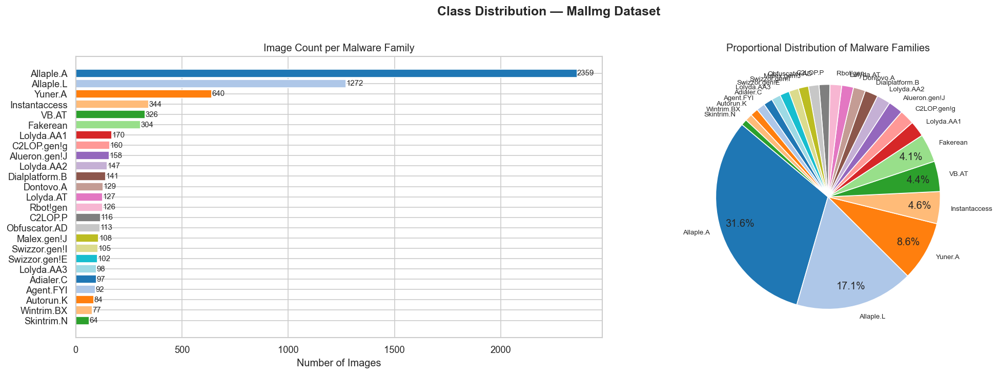


--- Summary Statistics ---
Min images in a class  : 64 (Skintrim.N)
Max images in a class  : 2359 (Allaple.A)
Mean images per class  : 298.4
Std deviation          : 498.2

Imbalance ratio (max/min): 36.9x


In [22]:
class_counts = df['class'].value_counts().sort_values(ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Bar chart
ax = axes[0]
bars = ax.barh(class_counts.index, class_counts.values,
               color=sns.color_palette('tab20', len(class_counts)))
ax.set_xlabel('Number of Images')
ax.set_title('Image Count per Malware Family')
ax.invert_yaxis()
for bar, val in zip(bars, class_counts.values):
    ax.text(val + 1, bar.get_y() + bar.get_height()/2,
            str(val), va='center', fontsize=9)

# Pie chart
ax2 = axes[1]
wedges, texts, autotexts = ax2.pie(
    class_counts.values,
    labels=class_counts.index,
    autopct=lambda p: f'{p:.1f}%' if p > 3 else '',
    startangle=140,
    colors=sns.color_palette('tab20', len(class_counts)),
    pctdistance=0.82
)
for text in texts:
    text.set_fontsize(8)
ax2.set_title('Proportional Distribution of Malware Families')

plt.suptitle('Class Distribution — MalImg Dataset', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('figs/malimg/Class Distribution — MalImg Dataset.png', bbox_inches='tight')
plt.show()

print('\n--- Summary Statistics ---')
print(f'Min images in a class  : {class_counts.min()} ({class_counts.idxmin()})')
print(f'Max images in a class  : {class_counts.max()} ({class_counts.idxmax()})')
print(f'Mean images per class  : {class_counts.mean():.1f}')
print(f'Std deviation          : {class_counts.std():.1f}')
print(f'\nImbalance ratio (max/min): {class_counts.max()/class_counts.min():.1f}x')

## 4. Image Dimension Analysis

In [23]:
def get_image_meta(path):
    try:
        img = Image.open(path)
        w, h = img.size
        mode = img.mode
        return w, h, w * h, mode
    except Exception:
        return None, None, None, None

print('Reading image metadata...')
meta = [get_image_meta(p) for p in tqdm(df['path'])]
df[['width', 'height', 'pixels', 'mode']] = pd.DataFrame(meta, columns=['width', 'height', 'pixels', 'mode'])

print('\n--- Dimension Statistics ---')
print(df[['width', 'height', 'pixels']].describe().round(1))

Reading image metadata...


  0%|          | 0/7459 [00:00<?, ?it/s]


--- Dimension Statistics ---
        width  height     pixels
count  7459.0  7459.0     7459.0
mean    334.1   435.9   175539.5
std     218.3   196.4   200520.6
min      64.0   208.0    13312.0
25%     128.0   280.0    57856.0
50%     256.0   424.0    77824.0
75%     512.0   467.0   209920.0
max    1024.0  3605.0  3691520.0


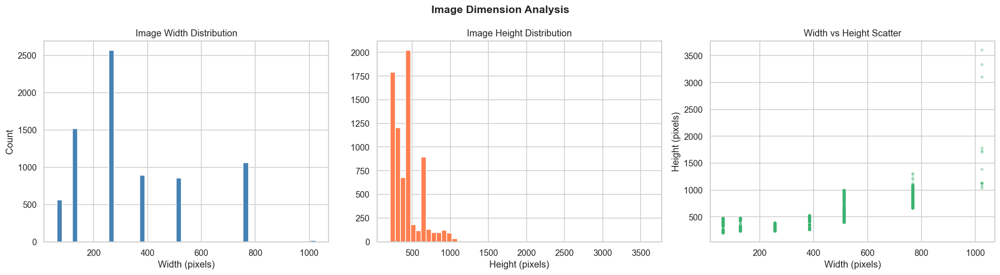

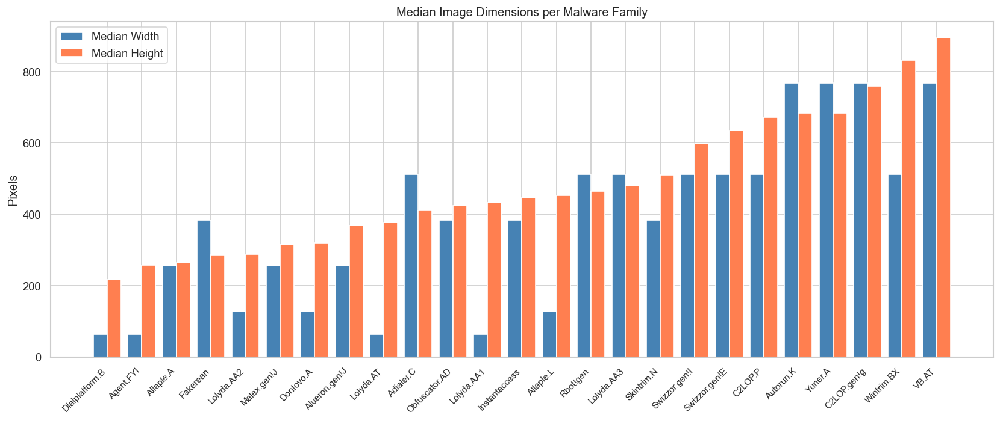

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(df['width'], bins=50, color='steelblue', edgecolor='white')
axes[0].set_title('Image Width Distribution')
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Count')

axes[1].hist(df['height'], bins=50, color='coral', edgecolor='white')
axes[1].set_title('Image Height Distribution')
axes[1].set_xlabel('Height (pixels)')

axes[2].scatter(df['width'], df['height'], alpha=0.3, s=8, c='mediumseagreen')
axes[2].set_title('Width vs Height Scatter')
axes[2].set_xlabel('Width (pixels)')
axes[2].set_ylabel('Height (pixels)')

plt.suptitle('Image Dimension Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('figs/malimg/Image Dimension Analysis.png', bbox_inches='tight')
plt.show()

# Per-class median size
size_by_class = df.groupby('class')[['width', 'height']].median().sort_values('height')
fig, ax = plt.subplots(figsize=(14, 6))
x = np.arange(len(size_by_class))
ax.bar(x - 0.2, size_by_class['width'], 0.4, label='Median Width', color='steelblue')
ax.bar(x + 0.2, size_by_class['height'], 0.4, label='Median Height', color='coral')
ax.set_xticks(x)
ax.set_xticklabels(size_by_class.index, rotation=45, ha='right', fontsize=9)
ax.set_ylabel('Pixels')
ax.set_title('Median Image Dimensions per Malware Family')
ax.legend()
plt.tight_layout()
plt.savefig('figs/malimg/Median Image Dimensions per Malware Family.png', bbox_inches='tight')
plt.show()

## 5. Pixel Intensity Analysis

In [25]:
def compute_pixel_stats(path, resize=(128, 128)):
    """Return mean, std, entropy, and dark/bright pixel fractions for an image."""
    try:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None
        img_r = cv2.resize(img, resize)
        flat = img_r.flatten().astype(np.float32)
        hist = np.histogram(flat, bins=256, range=(0, 255))[0]
        hist_norm = hist / hist.sum()
        ent = scipy_entropy(hist_norm + 1e-10)
        return {
            'mean_intensity': flat.mean(),
            'std_intensity': flat.std(),
            'entropy': ent,
            'dark_fraction': (flat < 50).mean(),
            'bright_fraction': (flat > 200).mean(),
        }
    except Exception:
        return None

print('Computing pixel statistics (this may take a minute)...')
stats = [compute_pixel_stats(p) for p in tqdm(df['path'])]
stats_df = pd.DataFrame(stats)
df = pd.concat([df.reset_index(drop=True), stats_df], axis=1)

print('\n--- Pixel Statistics Summary ---')
df[['mean_intensity', 'std_intensity', 'entropy', 'dark_fraction', 'bright_fraction']].describe().round(3)

Computing pixel statistics (this may take a minute)...


  0%|          | 0/7459 [00:00<?, ?it/s]


--- Pixel Statistics Summary ---


,mean_intensity,std_intensity,entropy,dark_fraction,bright_fraction
count,7459.000,7459.000,7459.000,7459.000,7459.000
mean,113.873,57.370,5.151,0.163,0.085
std,17.841,9.338,0.580,0.119,0.091
min,14.539,37.626,1.079,0.037,0.008
25%,109.424,46.475,5.200,0.063,0.042
50%,121.993,60.009,5.226,0.148,0.052
75%,123.650,63.782,5.409,0.186,0.127
max,184.118,81.034,5.478,0.895,0.853


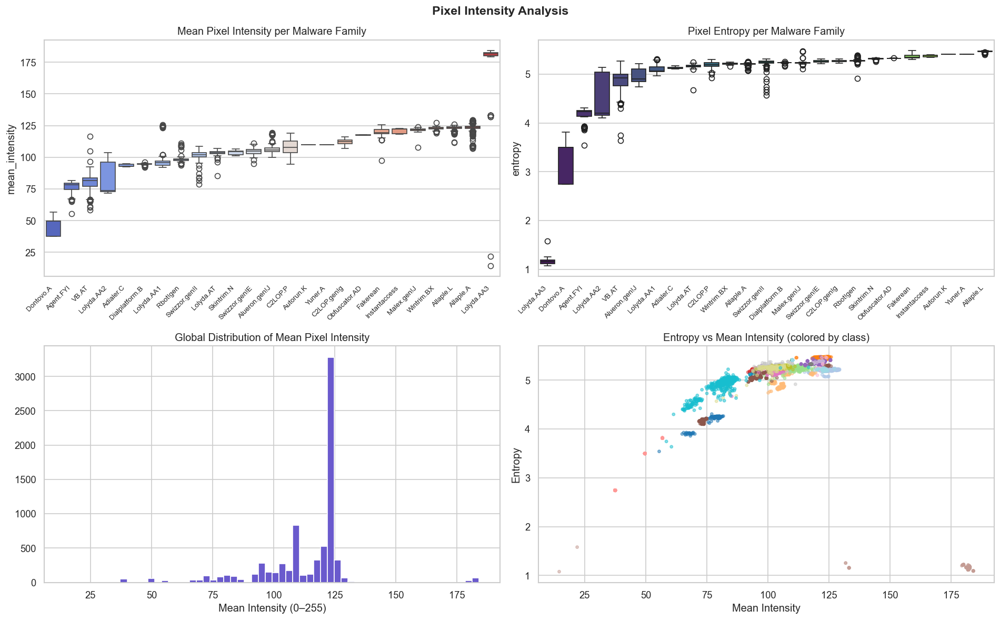

In [26]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Mean intensity per class
order = df.groupby('class')['mean_intensity'].mean().sort_values().index
sns.boxplot(data=df, x='class', y='mean_intensity', order=order,
            palette='coolwarm', ax=axes[0,0])
axes[0,0].set_xticklabels(axes[0,0].get_xticklabels(), rotation=45, ha='right', fontsize=8)
axes[0,0].set_title('Mean Pixel Intensity per Malware Family')
axes[0,0].set_xlabel('')

# Entropy per class
order_e = df.groupby('class')['entropy'].mean().sort_values().index
sns.boxplot(data=df, x='class', y='entropy', order=order_e,
            palette='viridis', ax=axes[0,1])
axes[0,1].set_xticklabels(axes[0,1].get_xticklabels(), rotation=45, ha='right', fontsize=8)
axes[0,1].set_title('Pixel Entropy per Malware Family')
axes[0,1].set_xlabel('')

# Global intensity histogram
axes[1,0].hist(df['mean_intensity'].dropna(), bins=60, color='slateblue', edgecolor='white')
axes[1,0].set_title('Global Distribution of Mean Pixel Intensity')
axes[1,0].set_xlabel('Mean Intensity (0–255)')

# Entropy vs Mean Intensity
sc = axes[1,1].scatter(df['mean_intensity'], df['entropy'],
                       c=LabelEncoder().fit_transform(df['class']),
                       cmap='tab20', alpha=0.5, s=10)
axes[1,1].set_title('Entropy vs Mean Intensity (colored by class)')
axes[1,1].set_xlabel('Mean Intensity')
axes[1,1].set_ylabel('Entropy')

plt.suptitle('Pixel Intensity Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('figs/malimg/Pixel Intensity Analysis.png', bbox_inches='tight')
plt.show()

## 6. Sample Image Visualization per Class

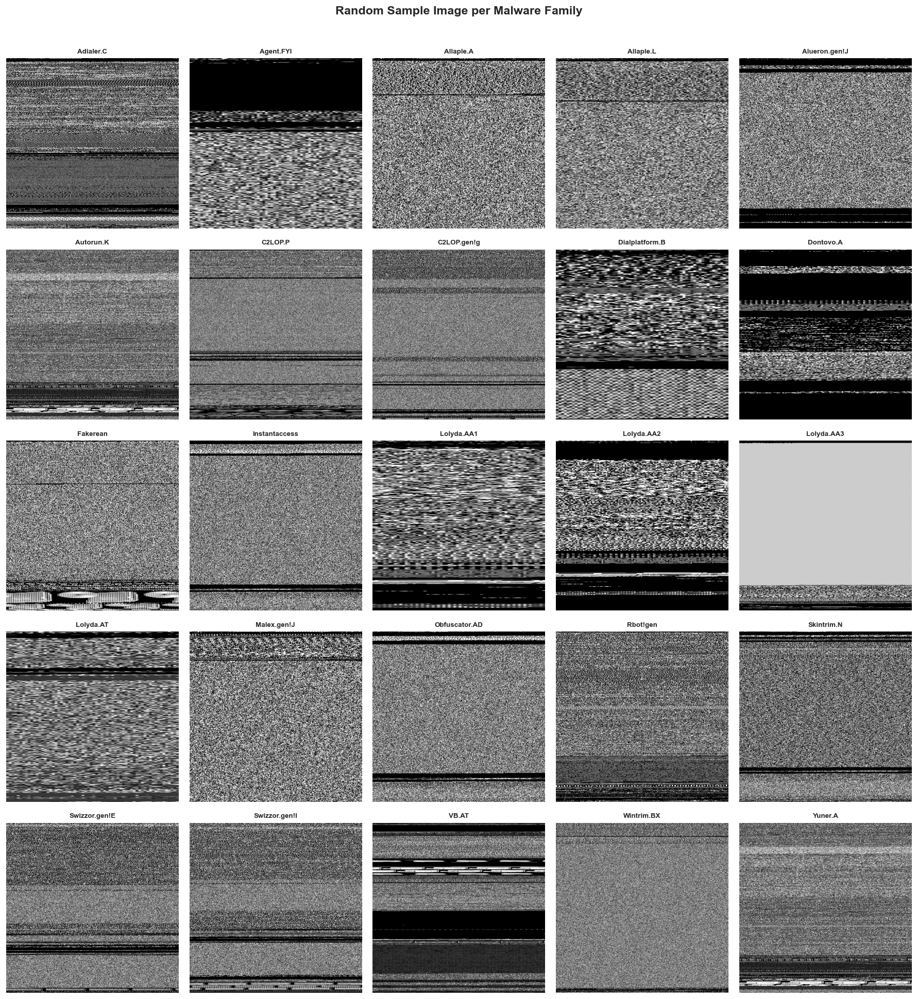

In [27]:
n_cols = 5
n_rows = -(-len(classes) // n_cols)  # ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3.2))
axes = axes.flatten()

for i, cls in enumerate(sorted(classes)):
    cls_paths = df[df['class'] == cls]['path'].tolist()
    sample_path = random.choice(cls_paths)
    img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
    axes[i].imshow(img, cmap='gray', aspect='auto')
    axes[i].set_title(cls, fontsize=8, fontweight='bold')
    axes[i].axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Random Sample Image per Malware Family', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('figs/malimg/Random Sample Image per Malware Family.png', bbox_inches='tight')
plt.show()

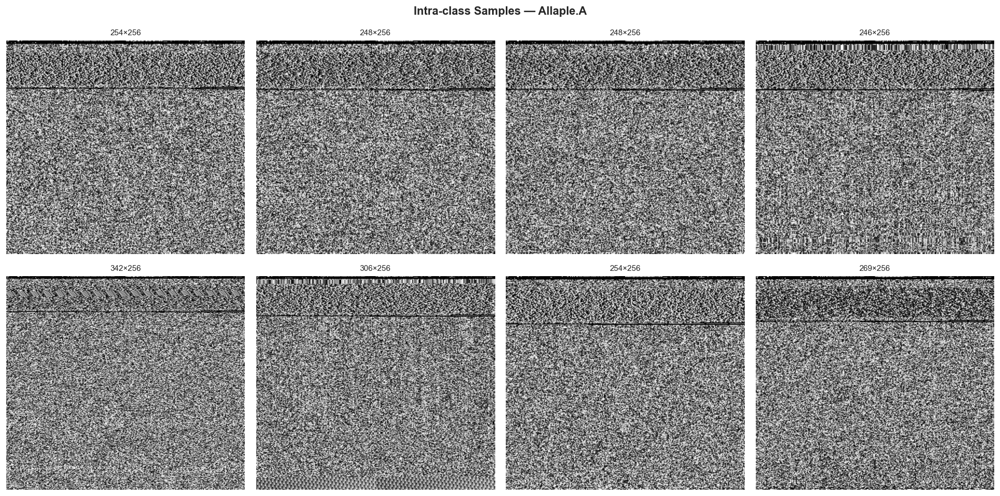

In [28]:
# Show multiple samples from a single family to visualize intra-class variance
FOCUS_CLASS = 'Allaple.A'   # <-- change to any class you like
samples = df[df['class'] == FOCUS_CLASS]['path'].sample(min(8, len(df[df['class']==FOCUS_CLASS])), random_state=SEED).tolist()

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, path in zip(axes.flatten(), samples):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(f'{img.shape[0]}×{img.shape[1]}', fontsize=9)
    ax.axis('off')

plt.suptitle(f'Intra-class Samples — {FOCUS_CLASS}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'figs/malimg/Intra-class Samples — {FOCUS_CLASS}.png', bbox_inches='tight')
plt.show()

## 7. Image Texture & Structural Analysis

Computing average images:   0%|          | 0/25 [00:00<?, ?it/s]

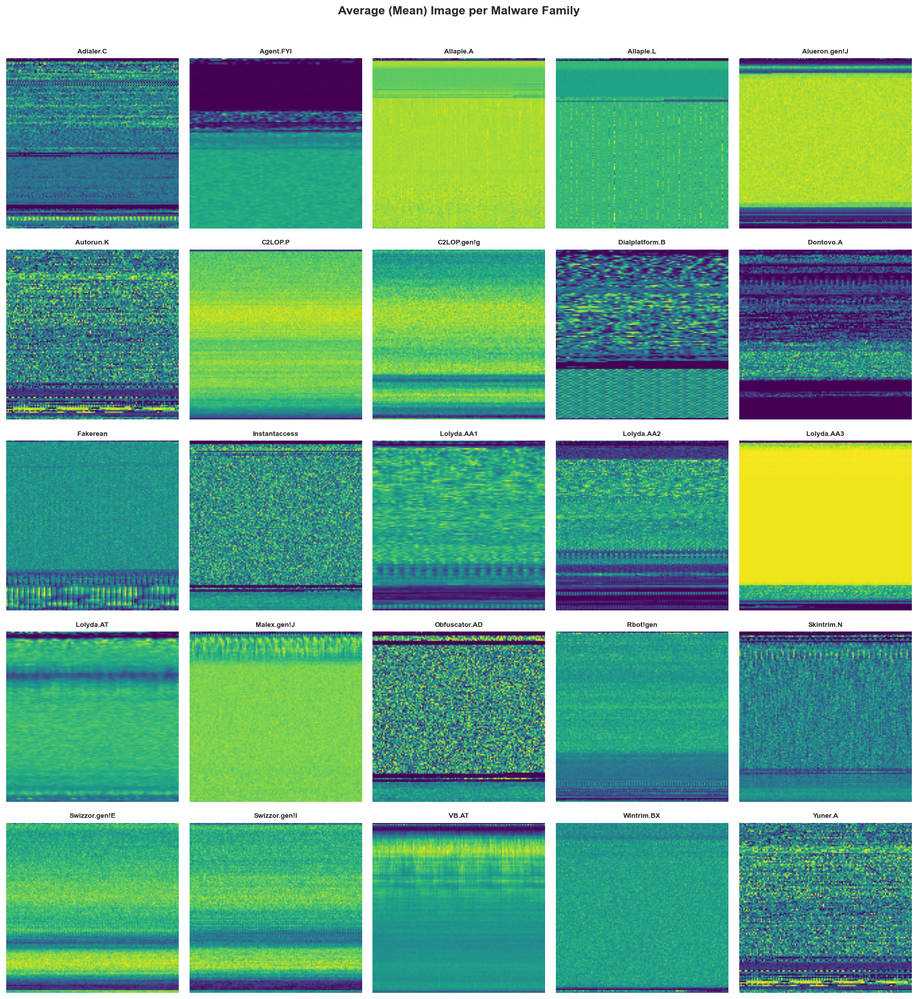

In [29]:
# ── 7a. Average image per class ───────────────────────────────────────────────
TARGET_SIZE = (128, 128)
avg_images = {}

for cls in tqdm(classes, desc='Computing average images'):
    paths = df[df['class'] == cls]['path'].tolist()
    imgs = []
    for p in paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            imgs.append(cv2.resize(img, TARGET_SIZE).astype(np.float32))
    if imgs:
        avg_images[cls] = np.mean(imgs, axis=0)

n_cols = 5
n_rows = -(-len(avg_images) // n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3.2))
axes = axes.flatten()

for i, (cls, avg_img) in enumerate(sorted(avg_images.items())):
    axes[i].imshow(avg_img, cmap='viridis', aspect='auto')
    axes[i].set_title(cls, fontsize=8, fontweight='bold')
    axes[i].axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Average (Mean) Image per Malware Family', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('figs/malimg/Average Image per Malware Family.png', bbox_inches='tight')
plt.show()

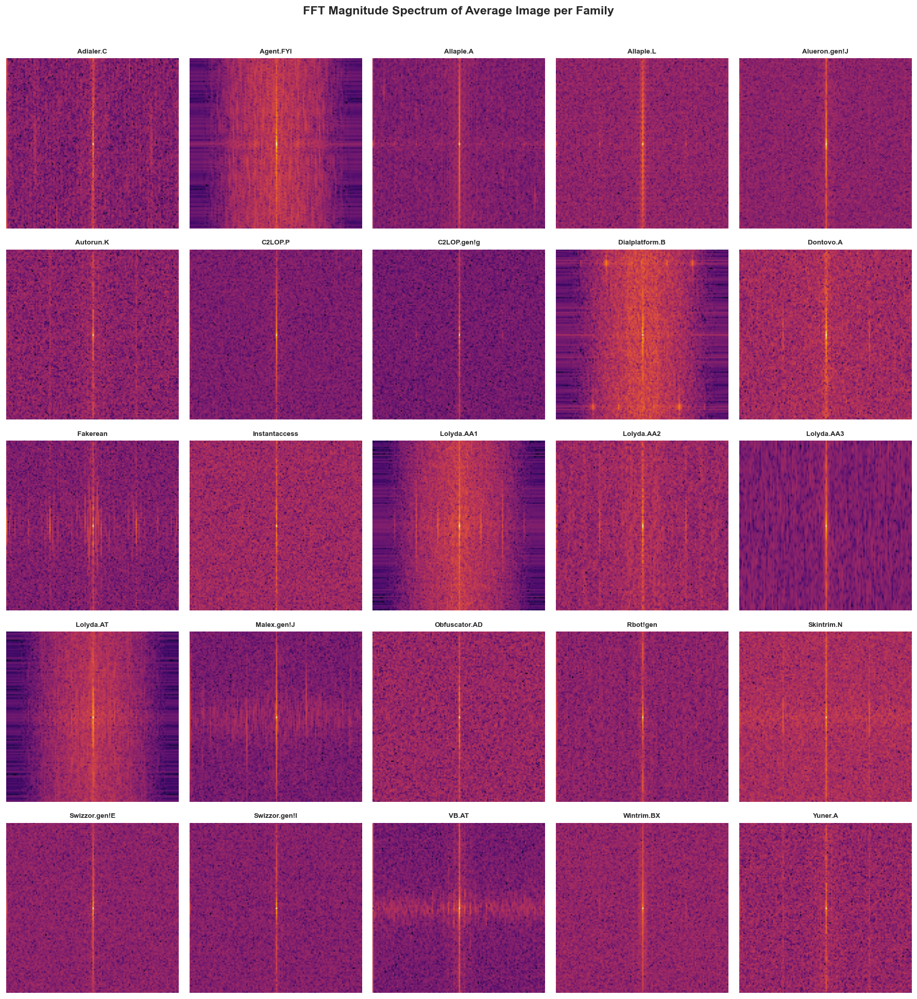

In [30]:
# ── 7b. FFT magnitude spectrum for each class ────────────────────────────────
fft_avgs = {}
for cls, avg_img in avg_images.items():
    f = np.fft.fft2(avg_img)
    fshift = np.fft.fftshift(f)
    mag = 20 * np.log(np.abs(fshift) + 1)
    fft_avgs[cls] = mag

n_cols = 5
n_rows = -(-len(fft_avgs) // n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3.2))
axes = axes.flatten()

for i, (cls, mag) in enumerate(sorted(fft_avgs.items())):
    axes[i].imshow(mag, cmap='inferno', aspect='auto')
    axes[i].set_title(cls, fontsize=8, fontweight='bold')
    axes[i].axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('FFT Magnitude Spectrum of Average Image per Family', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('figs/malimg/FFT Magnitude Spectrum of Average Image per Family.png', bbox_inches='tight')
plt.show()

LBP histograms:   0%|          | 0/25 [00:00<?, ?it/s]

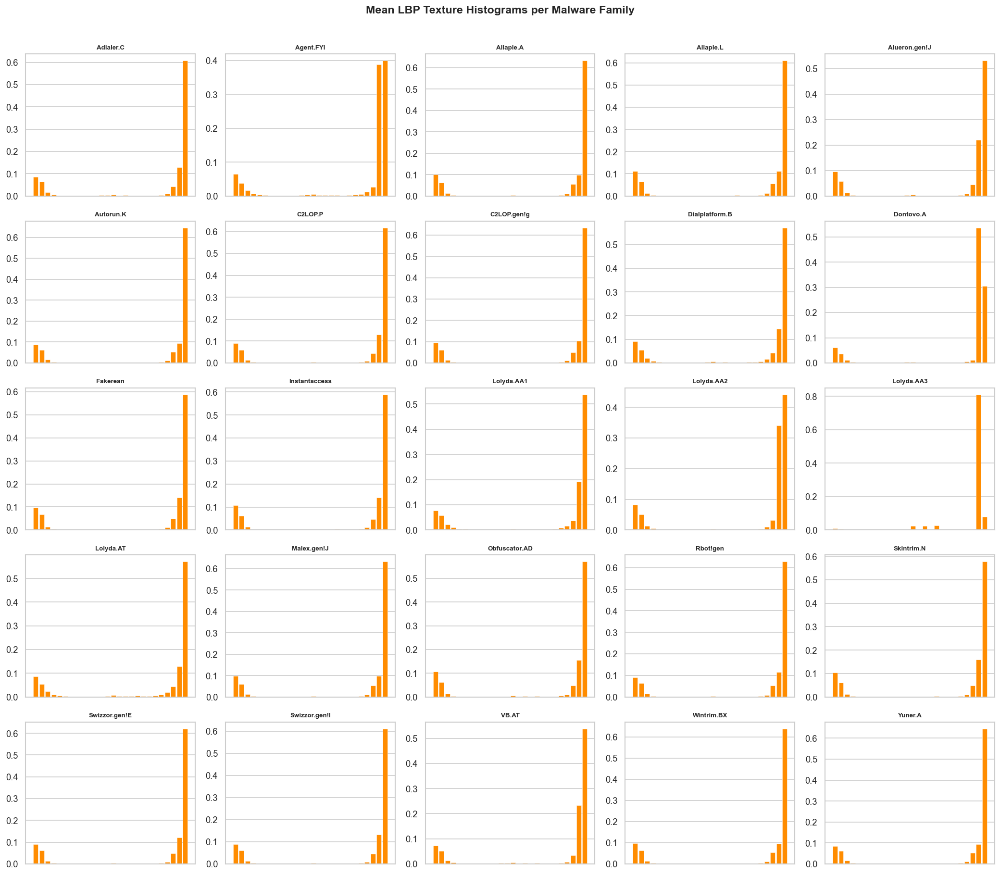

In [31]:
# ── 7c. LBP Histograms ───────────────────────────────────────────────────────
LBP_RADIUS = 3
LBP_POINTS = 8 * LBP_RADIUS

def compute_lbp_histogram(path, resize=(128, 128)):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    img = cv2.resize(img, resize)
    lbp = local_binary_pattern(img, LBP_POINTS, LBP_RADIUS, method='uniform')
    hist, _ = np.histogram(lbp.ravel(), bins=LBP_POINTS + 2,
                            range=(0, LBP_POINTS + 2), density=True)
    return hist

# Compute mean LBP histogram per class
lbp_class_hists = {}
for cls in tqdm(classes, desc='LBP histograms'):
    paths = df[df['class'] == cls]['path'].tolist()
    hists = [compute_lbp_histogram(p) for p in paths]
    hists = [h for h in hists if h is not None]
    if hists:
        lbp_class_hists[cls] = np.mean(hists, axis=0)

n_cols = 5
n_rows = -(-len(lbp_class_hists) // n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3.5, n_rows * 3))
axes = axes.flatten()

for i, (cls, hist) in enumerate(sorted(lbp_class_hists.items())):
    axes[i].bar(range(len(hist)), hist, color='darkorange', edgecolor='white', linewidth=0.3)
    axes[i].set_title(cls, fontsize=8, fontweight='bold')
    axes[i].set_xticks([])

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Mean LBP Texture Histograms per Malware Family', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('figs/malimg/Mean LBP Texture Histograms per Malware Family.png', bbox_inches='tight')
plt.show()

## 8. Intra-class vs Inter-class Similarity (Correlation Heatmap)

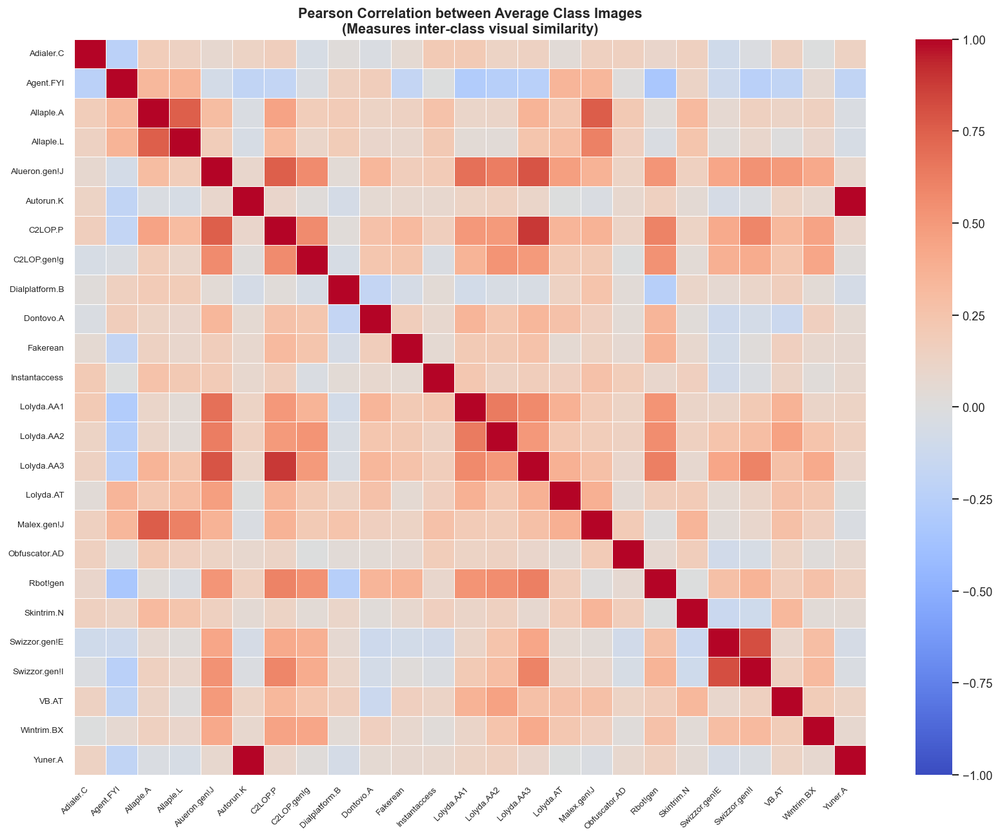

Most similar pair : Autorun.K ↔ Yuner.A  (r=0.993)
Least similar pair: Allaple.L ↔ VB.AT  (r=0.003)


In [32]:
# Build a class-level feature matrix from average images (flattened)
class_names_sorted = sorted(avg_images.keys())
feature_matrix = np.array([avg_images[c].flatten() for c in class_names_sorted])

# Pearson correlation between every pair of classes
corr_matrix = np.corrcoef(feature_matrix)

fig, ax = plt.subplots(figsize=(14, 11))
mask = np.eye(len(class_names_sorted), dtype=bool)  # mask diagonal
sns.heatmap(
    corr_matrix,
    xticklabels=class_names_sorted,
    yticklabels=class_names_sorted,
    cmap='coolwarm',
    center=0,
    vmin=-1, vmax=1,
    annot=False,
    linewidths=0.3,
    ax=ax
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)
ax.set_title('Pearson Correlation between Average Class Images\n(Measures inter-class visual similarity)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('figs/malimg/Pearson Correlation between Average Class Images.png', bbox_inches='tight')
plt.show()

# Most similar pair
upper = np.triu(corr_matrix, k=1)
idx = np.unravel_index(np.argmax(upper), upper.shape)
print(f'Most similar pair : {class_names_sorted[idx[0]]} ↔ {class_names_sorted[idx[1]]}  (r={corr_matrix[idx]:.3f})')
lower_vals = upper[upper > 0]
idx_min = np.unravel_index(np.argmin(np.where(upper > 0, upper, np.inf)), upper.shape)
print(f'Least similar pair: {class_names_sorted[idx_min[0]]} ↔ {class_names_sorted[idx_min[1]]}  (r={corr_matrix[idx_min]:.3f})')

## 9. Dimensionality Reduction — PCA & t-SNE

In [33]:
# Sample up to N images per class to keep computation manageable
N_PER_CLASS = 30
TARGET_SIZE_DR = (64, 64)

sampled_paths, sampled_labels = [], []
for cls in classes:
    cls_paths = df[df['class'] == cls]['path'].tolist()
    chosen = random.sample(cls_paths, min(N_PER_CLASS, len(cls_paths)))
    sampled_paths.extend(chosen)
    sampled_labels.extend([cls] * len(chosen))

# Load & flatten images
X, valid_labels = [], []
for path, lbl in tqdm(zip(sampled_paths, sampled_labels), total=len(sampled_paths), desc='Loading images'):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is not None:
        img_r = cv2.resize(img, TARGET_SIZE_DR).flatten().astype(np.float32) / 255.0
        X.append(img_r)
        valid_labels.append(lbl)

X = np.array(X)
le = LabelEncoder()
y = le.fit_transform(valid_labels)
print(f'Feature matrix shape: {X.shape}')

Loading images:   0%|          | 0/750 [00:00<?, ?it/s]

Feature matrix shape: (750, 4096)


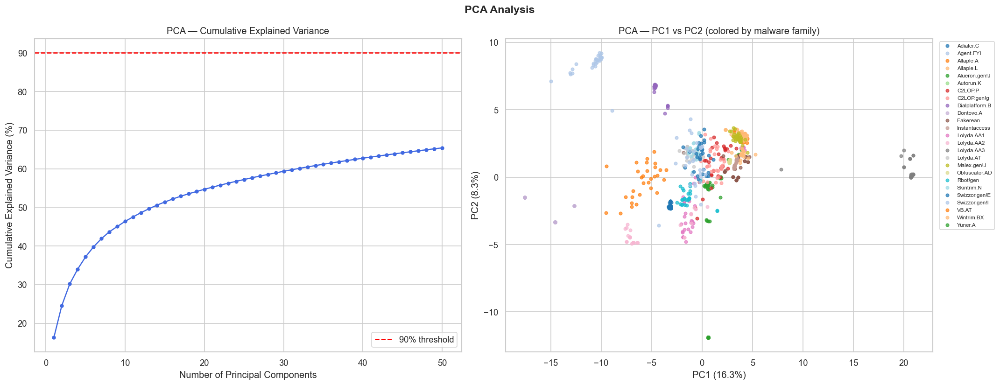

Components needed for 90% variance: 51


In [34]:
# ── PCA ───────────────────────────────────────────────────────────────────────
pca = PCA(n_components=50, random_state=SEED)
X_pca = pca.fit_transform(X)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Explained variance
cumvar = np.cumsum(pca.explained_variance_ratio_)
axes[0].plot(range(1, len(cumvar) + 1), cumvar * 100, marker='o', markersize=4, color='royalblue')
axes[0].axhline(90, color='red', linestyle='--', label='90% threshold')
axes[0].set_xlabel('Number of Principal Components')
axes[0].set_ylabel('Cumulative Explained Variance (%)')
axes[0].set_title('PCA — Cumulative Explained Variance')
axes[0].legend()

# PCA scatter (PC1 vs PC2)
palette = sns.color_palette('tab20', len(classes))
for i, cls in enumerate(le.classes_):
    mask = y == i
    axes[1].scatter(X_pca[mask, 0], X_pca[mask, 1],
                    label=cls, color=palette[i], s=15, alpha=0.7)
axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
axes[1].set_title('PCA — PC1 vs PC2 (colored by malware family)')
axes[1].legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=7, ncol=1)

plt.suptitle('PCA Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('figs/malimg/PCA Analysis.png', bbox_inches='tight')
plt.show()

n90 = np.searchsorted(cumvar, 0.90) + 1
print(f'Components needed for 90% variance: {n90}')

In [35]:
# ── t-SNE ─────────────────────────────────────────────────────────────────────
print('Running t-SNE (this may take 2–3 minutes)...')
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=SEED, verbose=0)
X_tsne = tsne.fit_transform(X_pca[:, :30])  # use top-30 PCs as input

fig, ax = plt.subplots(figsize=(14, 10))
palette = sns.color_palette('tab20', len(le.classes_))
for i, cls in enumerate(le.classes_):
    mask = y == i
    ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
               label=cls, color=palette[i], s=25, alpha=0.75, edgecolors='white', linewidths=0.2)
ax.set_title('t-SNE Projection of Malware Images (colored by family)', fontsize=13, fontweight='bold')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=8, ncol=1)
plt.tight_layout()
plt.savefig('figs/malimg/t-SNE Projection of Malware Images.png', bbox_inches='tight')
plt.show()

Running t-SNE (this may take 2–3 minutes)...


TypeError: TSNE.__init__() got an unexpected keyword argument 'n_iter'

## 10. Feature Correlation & Pairplot

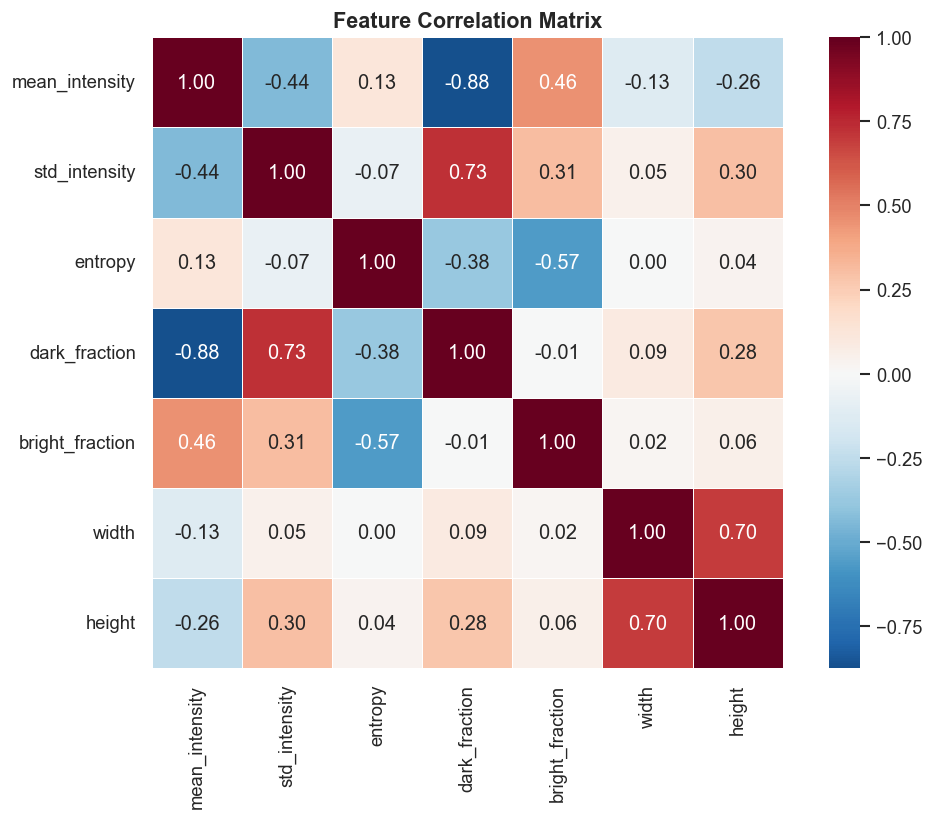

In [ ]:
feature_cols = ['mean_intensity', 'std_intensity', 'entropy', 'dark_fraction', 'bright_fraction', 'width', 'height']
corr = df[feature_cols].corr()

fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            square=True, linewidths=0.5, ax=ax)
ax.set_title('Feature Correlation Matrix', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

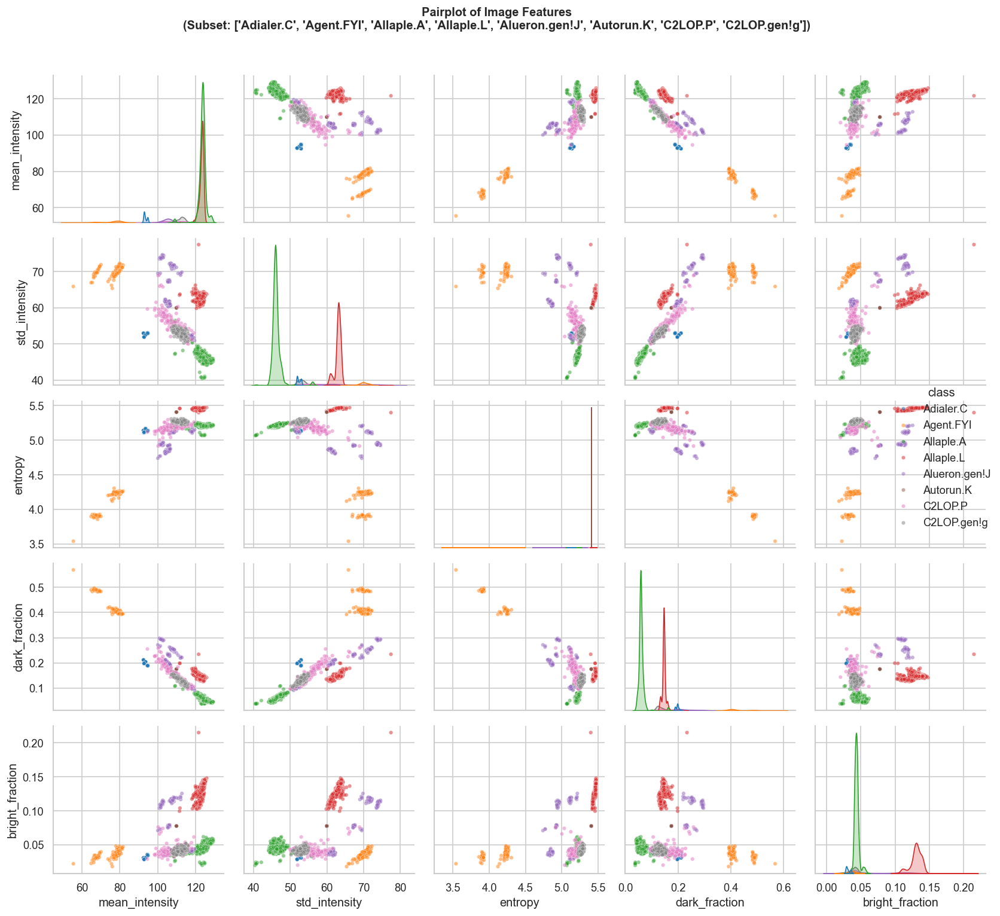

In [ ]:
# Focused pairplot on a subset of classes for readability
SUBSET_CLASSES = sorted(classes)[:8]  # first 8 classes alphabetically
subset_df = df[df['class'].isin(SUBSET_CLASSES)].copy()

g = sns.pairplot(
    subset_df[feature_cols[:5] + ['class']],
    hue='class',
    palette='tab10',
    plot_kws={'alpha': 0.5, 's': 15},
    diag_kind='kde'
)
g.figure.suptitle(f'Pairplot of Image Features\n(Subset: {SUBSET_CLASSES})',
                  y=1.02, fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('figs/malimg/Pairplot of Image Features.png', bbox_inches='tight')
plt.show()

## 11. Key Findings & Recommendations

### 📊 Dataset Overview
| Metric | Value |
|--------|-------|
| Total images | ~9,339 |
| Number of classes | 25 malware families |
| Image type | Grayscale PNG |
| Image sizes | Highly variable (depends on binary size) |

---

### 🔍 EDA Findings

1. **Class Imbalance** — The dataset is significantly imbalanced. Families like `Allaple.A` and `Allaple.L` contain thousands of samples, while others (e.g., `Skintrim.N`, `Yuner.A`) have fewer than 100. This must be addressed with oversampling, class weights, or augmentation.

2. **Image Size Variability** — Malware images vary drastically in size (from tiny to very large), because the image dimensions are determined by the size of the binary. Resizing to a fixed dimension is required before training any model.

3. **Pixel Intensity Differences** — Some families (e.g., packed malware like Skrenta) appear dark (low mean intensity), while others show dense texture patterns with higher mean intensity. This is a usable discriminating signal.

4. **Entropy as a Discriminator** — High-entropy images correspond to obfuscated/encrypted malware, while low-entropy images suggest more structured or sparse binaries. Entropy can be a useful handcrafted feature.

5. **Texture (LBP)** — LBP histograms show distinct patterns across families, indicating that texture is a meaningful feature for classification.

6. **PCA / t-SNE** — Dimensionality reduction reveals clear clustering for some families, while others overlap significantly. This suggests that CNN-based deep features will outperform handcrafted features for the harder classes.

---

### 🚀 Modeling Recommendations

- **Preprocessing**: Resize all images to a fixed size (e.g., `256×256` or `224×224`). Normalize pixel values to `[0, 1]`.
- **Augmentation**: Apply random flips, rotations, brightness jitter to address class imbalance and improve generalization.
- **Baseline**: Train a simple CNN or use a pre-trained model (e.g., ResNet-18 with grayscale input) as a baseline.
- **Handle Imbalance**: Use `class_weight='balanced'` or focal loss; consider SMOTE for handcrafted feature models.
- **Evaluation Metrics**: Use macro-F1, per-class precision/recall, and confusion matrix given the imbalanced nature of the dataset.